In [1]:
import os
import sys
import anndata
import numpy as np
import scipy
import matplotlib as mpl

import matplotlib.cm as cm

sys.path.append('E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/code/result_analysis/')
from visualization import RegisPlotter
from visual import RegisAnchorPlotter

def read_slices(dir, ctype_col='annotation'):
    li_int = [int(fname.split('.')[0]) for fname in os.listdir(dir) if fname.endswith('.h5ad')]
    li_int.sort()
    
    slicesl = []
    pili = []
    tyli = []
    for id in li_int:
        adata_path = os.path.join(dir, '{}.h5ad'.format(id))
        slice = anndata.read(adata_path)
        tyli += list(dict.fromkeys(slice.obs[ctype_col]))
        slicesl.append(slice)
    
        if not id == li_int[-1]:    
            pi_path = os.path.join(dir, '{}.npz'.format(id))
            pi = scipy.sparse.load_npz(pi_path).todense()
            pili.append(pi)
                     
    tyli = list(dict.fromkeys(tyli))          
    return slicesl, pili, tyli

In [ ]:
RegisAnchorPlotter

Fig 2

In [13]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'DLPFC_p_2_ours_ablation'
slicesl, pili, tyli = read_slices(os.path.join(dir_all, tissue_mtd))

In [ ]:
tyli

In [ ]:
rp = RegisPlotter(num_cols=4, fig_size=(14, 2.5))  # (8,5) for continuous colors
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid',  size=1, show_legend=True)

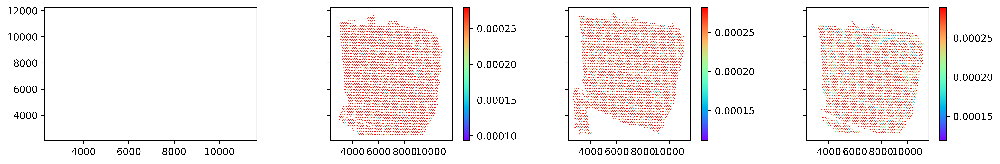

In [16]:
rap = RegisAnchorPlotter(num_cols=4, fig_size=(14, 2.5))
rap.plot_scatter_by_grid(slicesl, pili, None, [None]*(len(slicesl)-1), 'to_pre', 'pi_max', 'spatial', False, 'annotation', size=1)  
# num_anchors, pi_max, strong_anch

Fig 3

In [11]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'drosophila_embryo_PASTE2'
slicesl, _, _ = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(fig_size=(8,10))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid',  size=2.5, cmap='rainbow', show_legend=False)

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'drosophila_embryo_ours'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(fig_size=(22,10))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid',  size=1.5, cmap='rainbow', show_legend=True)

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'drosophila_larva_ours'
slicesl, _, _ = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(fig_size=(6,10))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_elas',  size=0.5, cmap='random', show_legend=False)

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'drosophila_larva_ours'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(fig_size=(22,10))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_elas',  size=0.3, cmap='random', show_legend=True)

Fig 5

In [ ]:
# generate anncell_color, used in both 3d_effect.ipynd and this notebook, so that 3d plot , 2d plot share the same colormap
dir = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline/mouse_embryo_E11.5_34_70_ours'
ctype_col = 'annotation'

# read in
fli = [int(fname.replace('.h5ad', '')) for fname in os.listdir(dir) if fname.endswith('.h5ad')]
fli.sort()
fli = [str(fname)+'.h5ad' for fname in fli]

cli = []
for i, fname in enumerate(fli[8:]):  
    adata = anndata.read(os.path.join(dir, fname))
    
    # keep the same rule of ctype_all generation, as when anncell_color (dic) is generated, in visualization.py, so we can skip the legend generation in k3d, also keep the consistancy of color assignment
    cli += adata.obs[ctype_col].tolist()

anno_cell_li = list(dict.fromkeys(cli))
np.random.seed(14)
color_li = mpl.colors.ListedColormap(np.random.rand(len(anno_cell_li), 3)).colors
# color_li = cm.rainbow(np.linspace(0, 1, len(anno_cell_li)))
anncell_color = dict(zip(anno_cell_li, color_li))

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'mouse_embryo_E11.5_ours'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=6, fig_size=(14,5))
rp.plot_scatter_by_grid(slicesl[:],  spatype='spatial_elas',  anncell_color=anncell_color, size=4, cmap='random', show_legend=False, axis_on=False)  

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'mouse_embryo_E11.5_PASTE'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=6, fig_size=(14,5))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid', anncell_color=anncell_color,  size=4, show_legend=False, axis_on=False)  

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'mouse_embryo_E11.5_PASTE2'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=6, fig_size=(14,5))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid', anncell_color=anncell_color,  size=4, show_legend=False, axis_on=False)  

Fig. 4

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'abra_leaves_ours'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=4, fig_size=(12,6))  
rp.plot_scatter_by_grid(slicesl,  spatype='spatial',  label_col='cell_type', size=0.5, cmap='rainbow', show_legend=False, axis_on=False)  

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'abra_leaves_ours'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=4, fig_size=(8,6))  # 12， 6， 0.8
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid',  label_col='cell_type', size=2.5, cmap='rainbow', show_legend=False, axis_on=False)  

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'abra_leaves_PASTE'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=4, fig_size=(8,6))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid',  label_col='cell_type', size=2.5, cmap='rainbow', show_legend=False, axis_on=False)  

In [ ]:
dir_all = 'E:/REGISTRATION_SOFTWARE/algorithm/cell_level_regist/paper/output_data/our_pipeline'
tissue_mtd = 'abra_leaves_PASTE2'
slicesl = read_slices(os.path.join(dir_all, tissue_mtd))

rp = RegisPlotter(num_cols=4, fig_size=(12,6))
rp.plot_scatter_by_grid(slicesl,  spatype='spatial_rigid',  label_col='cell_type', size=0.5, cmap='rainbow', show_legend=False, axis_on=False)  